In [1]:
import numpy as np
import pandas as pd
import torch
import torch.optim as optim
from torch import nn as nn
import matplotlib.pyplot as plt
import functools as Fntl
from functools import reduce
from torch.utils.data import DataLoader
from torch.utils.data import Dataset

In [2]:
df1 = pd.read_csv("data/from_book/hour.csv")

In [3]:
df1

,instant,dteday,season,yr,mnth,hr,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,0,6,0,1,0.24,0.2879,0.81,0.0000,3,13,16
1,2,2011-01-01,1,0,1,1,0,6,0,1,0.22,0.2727,0.80,0.0000,8,32,40
2,3,2011-01-01,1,0,1,2,0,6,0,1,0.22,0.2727,0.80,0.0000,5,27,32
3,4,2011-01-01,1,0,1,3,0,6,0,1,0.24,0.2879,0.75,0.0000,3,10,13
4,5,2011-01-01,1,0,1,4,0,6,0,1,0.24,0.2879,0.75,0.0000,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,17375,2012-12-31,1,1,12,19,0,1,1,2,0.26,0.2576,0.60,0.1642,11,108,119
17375,17376,2012-12-31,1,1,12,20,0,1,1,2,0.26,0.2576,0.60,0.1642,8,81,89
17376,17377,2012-12-31,1,1,12,21,0,1,1,1,0.26,0.2576,0.60,0.1642,7,83,90
17377,17378,2012-12-31,1,1,12,22,0,1,1,1,0.26,0.2727,0.56,0.1343,13,48,61


In [4]:
df1.columns

Index(['instant', 'dteday', 'season', 'yr', 'mnth', 'hr', 'holiday', 'weekday',
       'workingday', 'weathersit', 'temp', 'atemp', 'hum', 'windspeed',
       'casual', 'registered', 'cnt'],
      dtype='object')

#### make 1-hot input features

In [9]:
pd.unique(df1['season'])

array([1, 2, 3, 4])

In [11]:
pd.unique(df1['mnth'])

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

In [12]:
pd.unique(df1['hr'])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23])

In [13]:
pd.unique(df1['holiday'])

array([0, 1])

binary, keep as is

In [14]:
pd.unique(df1['weekday'])

array([6, 0, 1, 2, 3, 4, 5])

In [17]:
pd.unique(df1['workingday'])

array([0, 1])

binary, keep as is.

In [16]:
pd.unique(df1['weathersit'])

array([1, 2, 3, 4])

In [19]:
dummy_fields = ['season', 'mnth', 'hr', 'weekday', 'weathersit']

In [31]:
df_inp = Fntl.reduce(lambda acc, x: pd.concat([acc,
                                                pd.get_dummies(df1[x],
                                                               prefix=x,
                                                               drop_first=False)],
                                               axis=1),
                      dummy_fields,
                      pd.DataFrame())

In [32]:
df_inp

,season_1,season_2,season_3,season_4,mnth_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,...,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,weathersit_1,weathersit_2,weathersit_3,weathersit_4
0,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
1,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
2,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
3,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
4,1,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
17375,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
17376,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0
17377,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,1,0,0,0


In [33]:
df_inp.columns

Index(['season_1', 'season_2', 'season_3', 'season_4', 'mnth_1', 'mnth_2',
       'mnth_3', 'mnth_4', 'mnth_5', 'mnth_6', 'mnth_7', 'mnth_8', 'mnth_9',
       'mnth_10', 'mnth_11', 'mnth_12', 'hr_0', 'hr_1', 'hr_2', 'hr_3', 'hr_4',
       'hr_5', 'hr_6', 'hr_7', 'hr_8', 'hr_9', 'hr_10', 'hr_11', 'hr_12',
       'hr_13', 'hr_14', 'hr_15', 'hr_16', 'hr_17', 'hr_18', 'hr_19', 'hr_20',
       'hr_21', 'hr_22', 'hr_23', 'weekday_0', 'weekday_1', 'weekday_2',
       'weekday_3', 'weekday_4', 'weekday_5', 'weekday_6', 'weathersit_1',
       'weathersit_2', 'weathersit_3', 'weathersit_4'],
      dtype='object')

#### inclue binary features

In [34]:
binary_fields = ['holiday', 'workingday']

In [35]:
df_inp = Fntl.reduce(lambda acc, x: pd.concat([acc, df1[x]],
                                               axis=1),
                      binary_fields,
                      df_inp)

In [36]:
df_inp

,season_1,season_2,season_3,season_4,mnth_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,...,weekday_3,weekday_4,weekday_5,weekday_6,weathersit_1,weathersit_2,weathersit_3,weathersit_4,holiday,workingday
0,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
1,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
2,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
3,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
4,1,0,0,0,1,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
17375,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,1
17376,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1
17377,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1


In [37]:
df_inp.columns

Index(['season_1', 'season_2', 'season_3', 'season_4', 'mnth_1', 'mnth_2',
       'mnth_3', 'mnth_4', 'mnth_5', 'mnth_6', 'mnth_7', 'mnth_8', 'mnth_9',
       'mnth_10', 'mnth_11', 'mnth_12', 'hr_0', 'hr_1', 'hr_2', 'hr_3', 'hr_4',
       'hr_5', 'hr_6', 'hr_7', 'hr_8', 'hr_9', 'hr_10', 'hr_11', 'hr_12',
       'hr_13', 'hr_14', 'hr_15', 'hr_16', 'hr_17', 'hr_18', 'hr_19', 'hr_20',
       'hr_21', 'hr_22', 'hr_23', 'weekday_0', 'weekday_1', 'weekday_2',
       'weekday_3', 'weekday_4', 'weekday_5', 'weekday_6', 'weathersit_1',
       'weathersit_2', 'weathersit_3', 'weathersit_4', 'holiday',
       'workingday'],
      dtype='object')

#### normalize the quantitative data

In [38]:
qnt_fields = ['temp', 'atemp', 'hum', 'windspeed', 'casual', 'registered', 'cnt']

In [39]:
feature_statistics = {}
df_qnt = pd.DataFrame()
for k in qnt_fields:
    mean, std = (df1[k].mean(), df1[k].std())
    feature_statistics[k] = (mean, std)
    df_qnt[k] = (df1[k] - mean) / std

In [40]:
df_qnt

,temp,atemp,hum,windspeed,casual,registered,cnt
0,-1.334609,-1.093249,0.947345,-1.553844,-0.662736,-0.930162,-0.956312
1,-1.438475,-1.181698,0.895513,-1.553844,-0.561326,-0.804632,-0.823998
2,-1.438475,-1.181698,0.895513,-1.553844,-0.622172,-0.837666,-0.868103
3,-1.334609,-1.093249,0.636351,-1.553844,-0.662736,-0.949983,-0.972851
4,-1.334609,-1.093249,0.636351,-1.553844,-0.723582,-1.009445,-1.039008
...,...,...,...,...,...,...,...
17374,-1.230743,-1.269565,-0.141133,-0.211685,-0.500481,-0.302509,-0.388467
17375,-1.230743,-1.269565,-0.141133,-0.211685,-0.561326,-0.480894,-0.553859
17376,-1.230743,-1.269565,-0.141133,-0.211685,-0.581608,-0.467681,-0.548346
17377,-1.230743,-1.181698,-0.348463,-0.456086,-0.459917,-0.698922,-0.708224


#### add quantitative data into df_inp & df_tgt

In [41]:
qnt_features = ['temp', 'atemp', 'hum', 'windspeed']
qnt_tgts = ['casual', 'registered', 'cnt']

In [42]:
df_inp = pd.concat([df_inp, df_qnt[qnt_features]],
                   axis=1)

In [43]:
df_inp

,season_1,season_2,season_3,season_4,mnth_1,mnth_2,mnth_3,mnth_4,mnth_5,mnth_6,...,weathersit_1,weathersit_2,weathersit_3,weathersit_4,holiday,workingday,temp,atemp,hum,windspeed
0,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,-1.334609,-1.093249,0.947345,-1.553844
1,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,-1.438475,-1.181698,0.895513,-1.553844
2,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,-1.438475,-1.181698,0.895513,-1.553844
3,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,-1.334609,-1.093249,0.636351,-1.553844
4,1,0,0,0,1,0,0,0,0,0,...,1,0,0,0,0,0,-1.334609,-1.093249,0.636351,-1.553844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17374,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,-1.230743,-1.269565,-0.141133,-0.211685
17375,1,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,-1.230743,-1.269565,-0.141133,-0.211685
17376,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,-1.230743,-1.269565,-0.141133,-0.211685
17377,1,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,-1.230743,-1.181698,-0.348463,-0.456086


In [44]:
df_inp.columns

Index(['season_1', 'season_2', 'season_3', 'season_4', 'mnth_1', 'mnth_2',
       'mnth_3', 'mnth_4', 'mnth_5', 'mnth_6', 'mnth_7', 'mnth_8', 'mnth_9',
       'mnth_10', 'mnth_11', 'mnth_12', 'hr_0', 'hr_1', 'hr_2', 'hr_3', 'hr_4',
       'hr_5', 'hr_6', 'hr_7', 'hr_8', 'hr_9', 'hr_10', 'hr_11', 'hr_12',
       'hr_13', 'hr_14', 'hr_15', 'hr_16', 'hr_17', 'hr_18', 'hr_19', 'hr_20',
       'hr_21', 'hr_22', 'hr_23', 'weekday_0', 'weekday_1', 'weekday_2',
       'weekday_3', 'weekday_4', 'weekday_5', 'weekday_6', 'weathersit_1',
       'weathersit_2', 'weathersit_3', 'weathersit_4', 'holiday', 'workingday',
       'temp', 'atemp', 'hum', 'windspeed'],
      dtype='object')

In [45]:
df_tgt = df_qnt['cnt']

In [46]:
df_tgt

0       -0.956312
1       -0.823998
2       -0.868103
3       -0.972851
4       -1.039008
           ...   
17374   -0.388467
17375   -0.553859
17376   -0.548346
17377   -0.708224
17378   -0.774381
Name: cnt, Length: 17379, dtype: float64

#### make the train/test inp/tgt tensors

In [47]:
train_x = torch.tensor(df_inp[:-21*24].values).float()
test_x = torch.tensor(df_inp[-21*24:].values).float()

In [48]:
train_x.shape

torch.Size([16875, 57])

In [49]:
test_x.shape

torch.Size([504, 57])

In [51]:
tsr_tgt = torch.tensor(df_tgt.values.reshape(len(df_tgt),1)).float()

In [54]:
train_y = tsr_tgt[:-21*24,:]

In [55]:
test_y = tsr_tgt[-21*24:,:]

In [56]:
train_y.shape

torch.Size([16875, 1])

In [57]:
test_y.shape

torch.Size([504, 1])

### Make DataSet Object

In [58]:
class BSDataset(Dataset):
    def __init__(self, xs, ys):
        self.xs = xs
        self.ys = ys
    def __len__(self):
        return self.xs.shape[0]
    def __getitem__(self, id):
        return self.xs[id], self.ys[id]

In [59]:
train_set = BSDataset(train_x, train_y)

In [60]:
test_set = BSDataset(test_x, test_y)

In [61]:
batch_size = 128

In [62]:
train_dataloader = DataLoader(train_set, batch_size=batch_size)
test_dataloader = DataLoader(test_set, batch_size=batch_size)

### Make model

In [63]:
class BSModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(BSModel, self).__init__()
        self.stack = nn.Sequential(
            nn.Linear(input_size, hidden_size),
            nn.Sigmoid(),
            nn.Linear(hidden_size, output_size)
        )
    def forward(self, inp):
        return self.stack(inp)

In [64]:
inp_size = train_x.shape[1]
hidden_size = 10
output_size = 1

In [65]:
md0 = BSModel(inp_size, hidden_size, output_size)

### Make the train / test functions

In [66]:
optimizer = optim.SGD(md0.parameters(), lr=0.01)

In [67]:
loss_fn = nn.MSELoss()

In [68]:
def train_epoch(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    loss = 0.
    for batch, (X, y) in enumerate(dataloader):
        # Compute prediction and loss
        pred = model(X)
        loss = loss_fn(pred, y)

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        #if batch % 100 == 0:
        #    loss, current = loss.item(), batch * len(X)
        #    print(f"loss: {loss:>7f}  [{current:>8d}/{size:>8d}]")
    return loss

In [98]:
def trn_epoches(tot_epoches, model, loss_fn, dataloader, optimizer):
    losses = []
    for i in range(tot_epoches):
        loss = train_epoch(dataloader, model, loss_fn, optimizer)
        losses.append(loss)
        if i % 200 == 0:
            print(f"epoch {i:>6d}/{tot_epoches:>6d}, loss: {loss:>7f}")
    return losses
        

In [70]:
def test_loop(model, xs, ys, loss_fn):
    with torch.no_grad():
        pred = model(xs)
        test_loss = loss_fn(pred, ys).item()
    print(f"loss: {test_loss:>8f} \n")
    return pred

### Training

In [71]:
loss_hist = trn_epoches(1000, md0,loss_fn, train_dataloader,optimizer)


epoch      0/  1000, loss: 0.848422

epoch    200/  1000, loss: 0.270695

epoch    400/  1000, loss: 0.131978

epoch    600/  1000, loss: 0.097693

epoch    800/  1000, loss: 0.098435


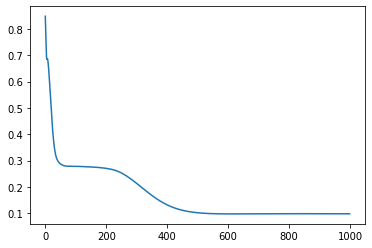

In [72]:
plt.plot(loss_hist)

### check train cycle 1

In [77]:
pred_train = test_loop(md0, train_x, train_y, loss_fn)

loss: 0.234949 



Pred vs test data (normalized)

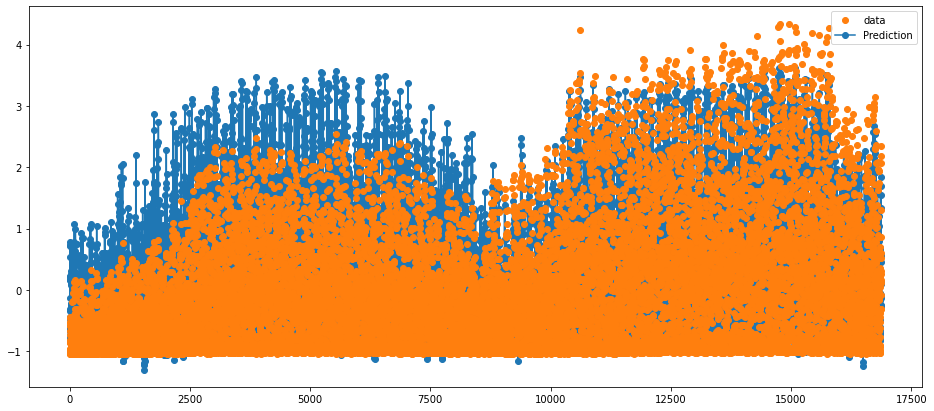

In [78]:
plt.figure(figsize = (16, 7))
#x_data = df_inp_test.reset_index()['index']
pred_data = pred_train.numpy()
tgt_data = train_y.numpy()
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(tgt_data, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

In [79]:
loss_hist_2 = trn_epoches(1000, md0,loss_fn, train_dataloader,optimizer)


epoch      0/  1000, loss: 0.098126

epoch    200/  1000, loss: 0.097160

epoch    400/  1000, loss: 0.095890

epoch    600/  1000, loss: 0.094509

epoch    800/  1000, loss: 0.093154


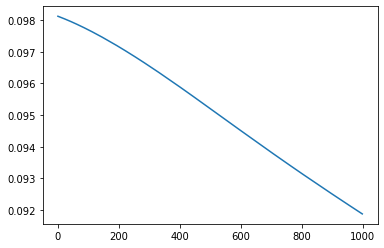

In [80]:
plt.plot(loss_hist_2)

In [81]:
pred_train_2 = test_loop(md0, train_x, train_y, loss_fn)

loss: 0.230061 



In [88]:
tgt_data_train = train_y.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]

In [90]:
tgt_data_test = df1['cnt'][-21*24:].values

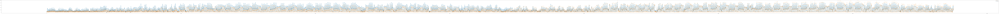

In [89]:
plt.figure(figsize = (500, 7))
#x_data = df_inp_test.reset_index()['index']
pred_data = pred_train_2.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(tgt_data_train, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

In [73]:
pred = test_loop(md0, test_x, test_y, loss_fn)

loss: 0.121414 



In [93]:
pred_data_test2 = pred.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]

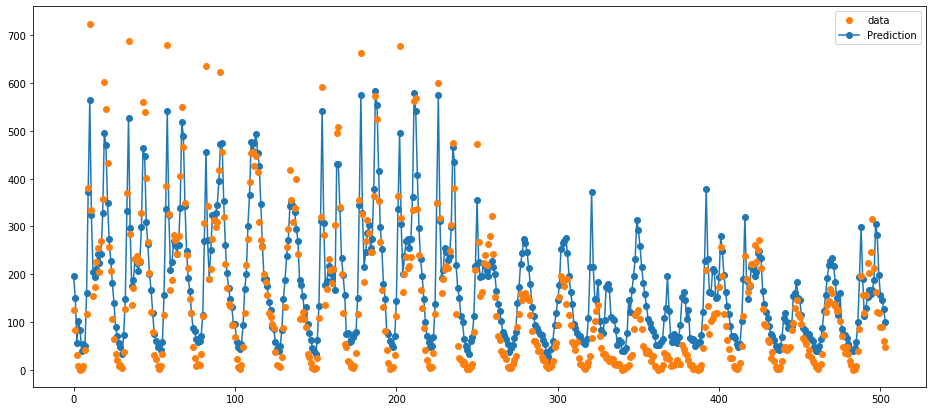

In [94]:
plt.figure(figsize = (16, 7))
#x_data = df_inp_test.reset_index()['index']
pred_plot, = plt.plot(pred_data_test2, 'o-')
cnt_plot, = plt.plot(tgt_data_test, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

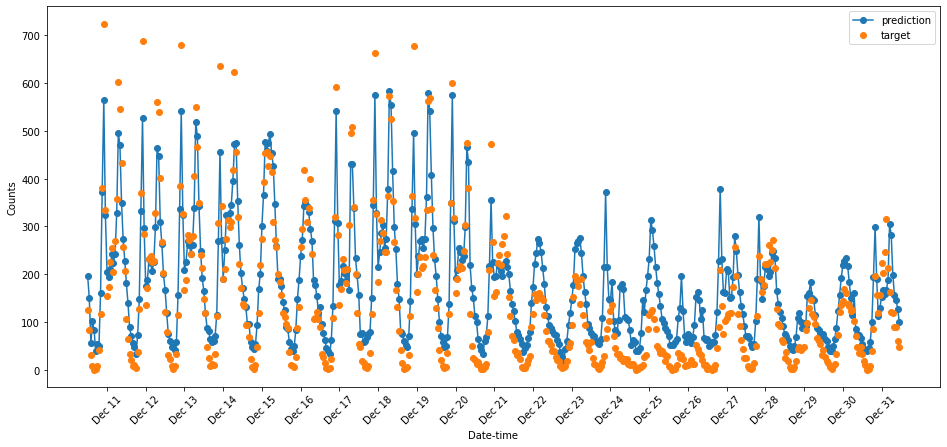

In [96]:
fig, ax = plt.subplots(figsize = (16, 7))


x_data = df_inp[-21*24:].reset_index()['index']

ax.plot(pred_data_test2, 'o-', label='prediction')
ax.plot(tgt_data_test, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[-21*24:].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

In [97]:
loss_hist_3 = trn_epoches(10000, md0,loss_fn, train_dataloader,optimizer)


epoch      0/ 10000, loss: 0.091867

epoch    200/ 10000, loss: 0.090632

epoch    400/ 10000, loss: 0.089437

epoch    600/ 10000, loss: 0.088296

epoch    800/ 10000, loss: 0.087225

epoch   1000/ 10000, loss: 0.086222

epoch   1200/ 10000, loss: 0.085277

epoch   1400/ 10000, loss: 0.084385

epoch   1600/ 10000, loss: 0.083550

epoch   1800/ 10000, loss: 0.082778

epoch   2000/ 10000, loss: 0.082078

epoch   2200/ 10000, loss: 0.081445

epoch   2400/ 10000, loss: 0.080877

epoch   2600/ 10000, loss: 0.080368

epoch   2800/ 10000, loss: 0.079910

epoch   3000/ 10000, loss: 0.079499

epoch   3200/ 10000, loss: 0.079130

epoch   3400/ 10000, loss: 0.078800

epoch   3600/ 10000, loss: 0.078505

epoch   3800/ 10000, loss: 0.078243

epoch   4000/ 10000, loss: 0.078013

epoch   4200/ 10000, loss: 0.077812

epoch   4400/ 10000, loss: 0.077641

epoch   4600/ 10000, loss: 0.077496

epoch   4800/ 10000, loss: 0.077378

epoch   5000/ 10000, loss: 0.077283

epoch   5200/ 10000, loss: 0.077208



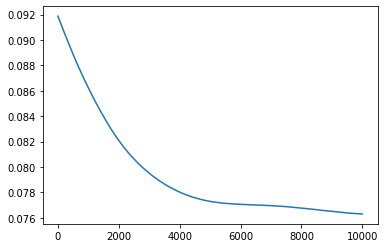

In [99]:
plt.plot(loss_hist_3)

In [100]:
pred_train_3 = test_loop(md0, train_x, train_y, loss_fn)

loss: 0.238708 



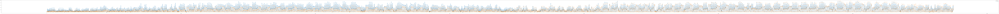

In [101]:
plt.figure(figsize = (500, 7))
pred_data = pred_train_3.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]
pred_plot, = plt.plot(pred_data, 'o-')
cnt_plot, = plt.plot(tgt_data_train, 'o')
plt.legend([cnt_plot, pred_plot],['data', 'Prediction'])
plt.show()

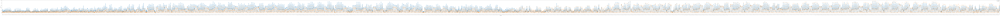

In [112]:
fig, ax = plt.subplots(figsize = (500, 7))

pred_data = pred_train_3.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]
ax.plot(pred_data, 'o-', label='prediction')
ax.plot(tgt_data_train, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[:-21*24].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.margins(x=0)
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

plot on train data

In [103]:
pred_test3 = test_loop(md0, test_x, test_y, loss_fn)

loss: 0.113562 



In [105]:
pred_data_test3 = pred_test3.numpy() * feature_statistics['cnt'][1] + feature_statistics['cnt'][0]

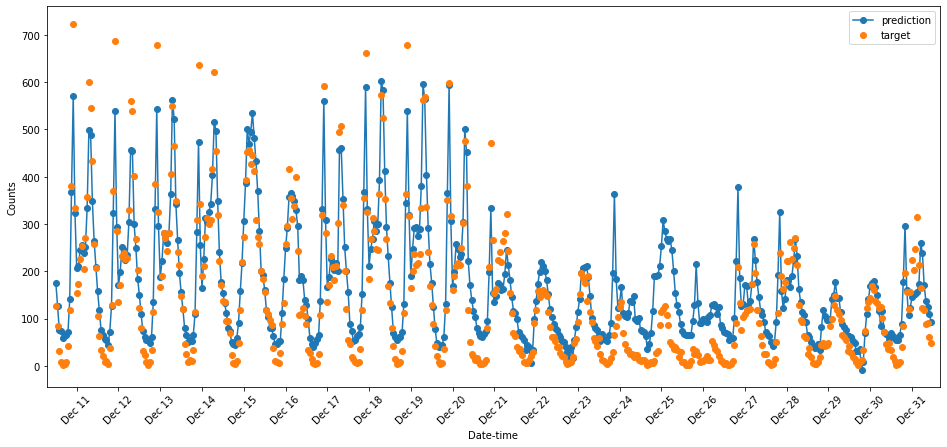

In [116]:
fig, ax = plt.subplots(figsize = (16, 7))
#x_data = df_inp[-21*24:].reset_index()['index']

ax.plot(pred_data_test3, 'o-', label='prediction')
ax.plot(tgt_data_test, 'o', label='target')
ax.legend()
ax.set_xlabel('Date-time')
ax.set_ylabel('Counts')

dates = pd.to_datetime(df1.loc[df_inp[-21*24:].index]['dteday'])
dates = dates.apply(lambda d: d.strftime('%b %d'))
ax.margins(x=0.01)
ax.set_xticks(np.arange(len(dates))[12::24])
_ = ax.set_xticklabels(dates[12::24], rotation=45)

plot on test data

In [117]:
md_dict = dict(md0.named_parameters())

In [119]:
md_dict.keys()

dict_keys(['stack.0.weight', 'stack.0.bias', 'stack.2.weight', 'stack.2.bias'])

In [122]:
md_dict['stack.0.weight'].shape

torch.Size([10, 57])

In [121]:
md_dict['stack.0.bias'].shape

torch.Size([10])

In [123]:
md_dict['stack.2.weight'].shape

torch.Size([1, 10])

In [124]:
md_dict['stack.2.bias'].shape

torch.Size([1])